In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd

In [2]:
debussy_file = 'debussy.wav'
piano_file = 'piano.wav'
rock_file = 'rock.wav'

In [6]:
debussy,sr = librosa.load(debussy_file)
piano,_ = librosa.load(piano_file)
rock,_ = librosa.load(rock_file)

### EXTRACTING SHORT-TERM FOURIER

In [7]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [8]:
s_debussy = librosa.stft(debussy,n_fft=FRAME_SIZE,hop_length=HOP_SIZE)
s_piano = librosa.stft(piano,n_fft=FRAME_SIZE,hop_length=HOP_SIZE)
s_rock = librosa.stft(rock,n_fft=FRAME_SIZE,hop_length=HOP_SIZE)

In [10]:
print(s_debussy.shape)
print(s_piano.shape)
print(s_rock.shape)

(1025, 12312)
(1025, 517)
(1025, 2537)


In [12]:
type(s_debussy[0][0])
type(s_piano[0][0])
type(s_rock[0][0])

numpy.complex64

 we can see that the short term transform values are in complex form which a transform will obviously give as it contains phase and magnitude(frequency) but for magnitude we will only consider the real number part not the imaginary one .

### CALCULATING THE SPECTROGRAMS

In [16]:
y_scale = np.abs(s_debussy)
y_scale1 = np.abs(s_piano)
y_scale2 = np.abs(s_rock)

In [17]:
print(y_scale.shape)
print(y_scale1.shape)
print(y_scale2.shape)

(1025, 12312)
(1025, 517)
(1025, 2537)


In [19]:
type(y_scale[0][0])
type(y_scale1[0][0])
type(y_scale2[0][0])

numpy.float32

here we only considered the frequency so the real number part remains as we absolute the stft value for frequency.


### VISUALIZING THE SPECTROGRAMS

In [20]:
def plot_spectrograms(Y,sr,hop_length,y_axis='linear'):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(Y,sr=sr,hop_length=hop_length,y_axis=y_axis)
    plt.colorbar(format="%+2.f")

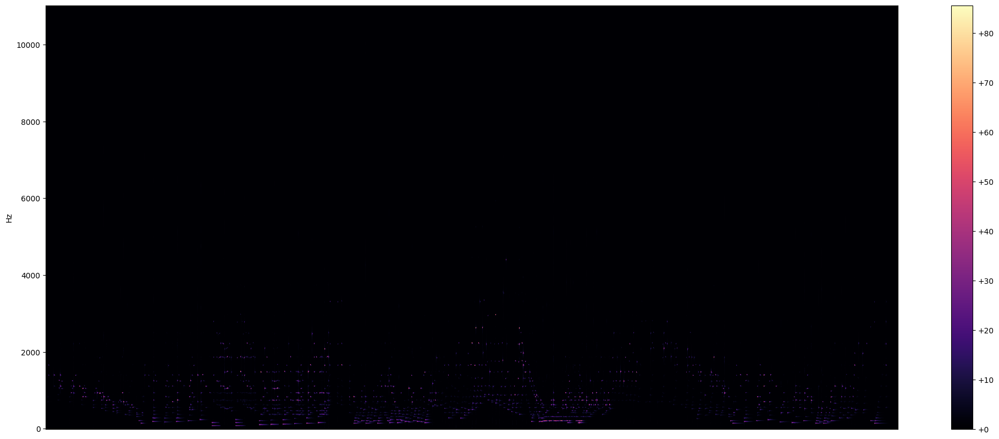

In [21]:
plot_spectrograms(y_scale, sr, HOP_SIZE)

we can see here are very little patches of sound enegy on this very big audio . why?
because we are perceiving the audios as linear but in reality we humans perceive it as logrithmic
so lets start.

### LOG-AMPLITUDE SPECTROGRAM

In [24]:
y_log_scale = librosa.power_to_db(y_scale, ref=np.max)
y_log_scale1 = librosa.power_to_db(y_scale1, ref=np.max)
y_log_scale2 = librosa.power_to_db(y_scale2, ref=np.max)

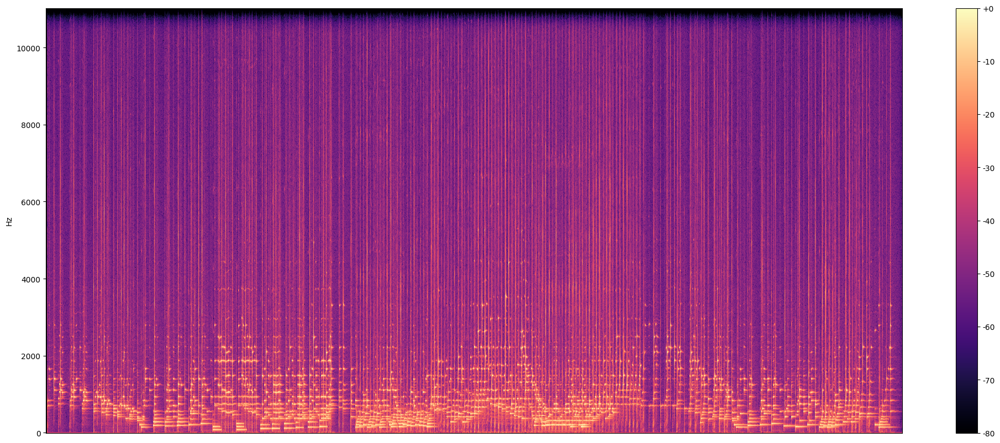

In [22]:

plot_spectrograms(y_log_scale, sr, HOP_SIZE)

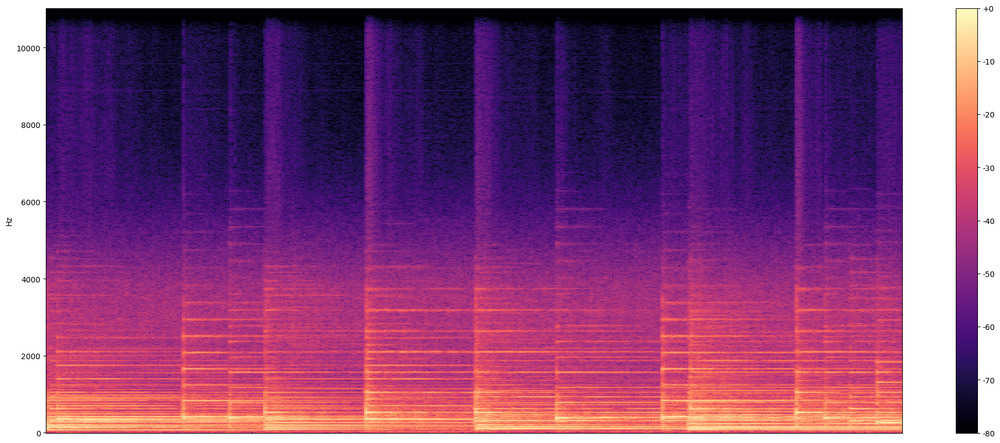

In [25]:
plot_spectrograms(y_log_scale1, sr, HOP_SIZE)

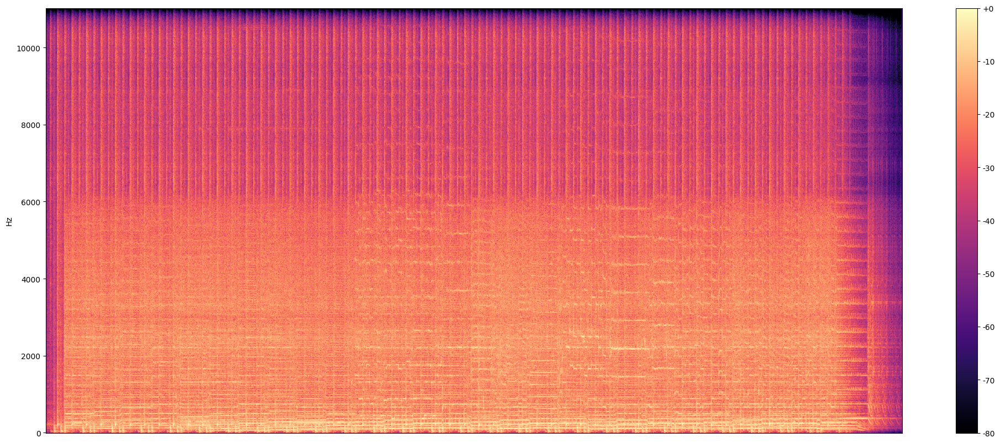

In [26]:
plot_spectrograms(y_log_scale2, sr, HOP_SIZE)

this is the specrtrogram for logrithmic values on axis of linear (y_axis = linear)

### LOG-FREQUENCY - LOG SPECTROGRAM

here the y_axis will also be logrithmic

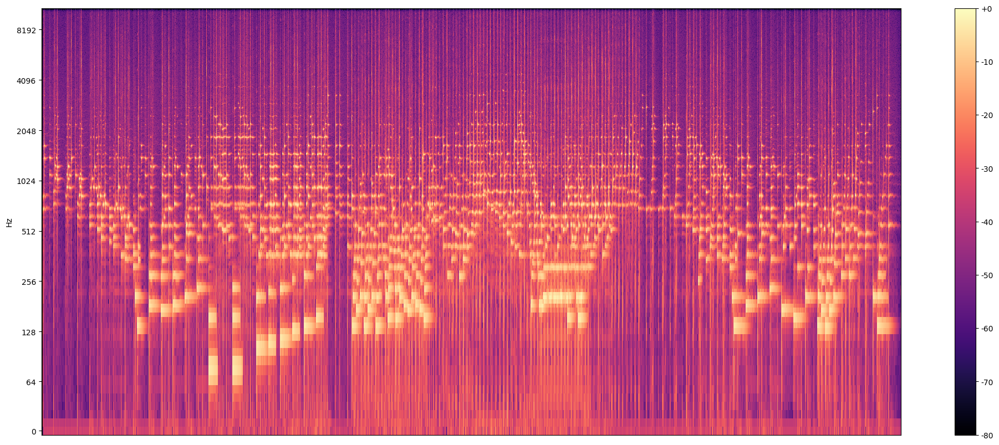

In [23]:
plot_spectrograms(y_log_scale, sr, HOP_SIZE, y_axis="log")

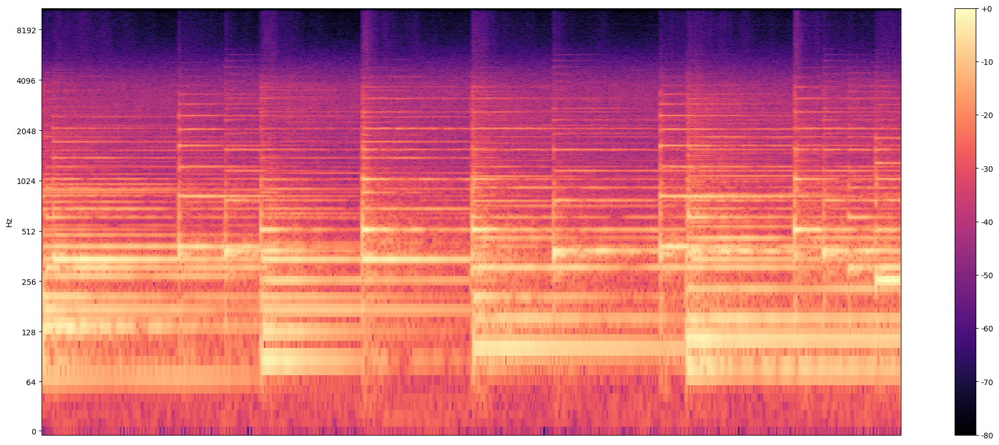

In [28]:
plot_spectrograms(y_log_scale1, sr, HOP_SIZE, y_axis="log")

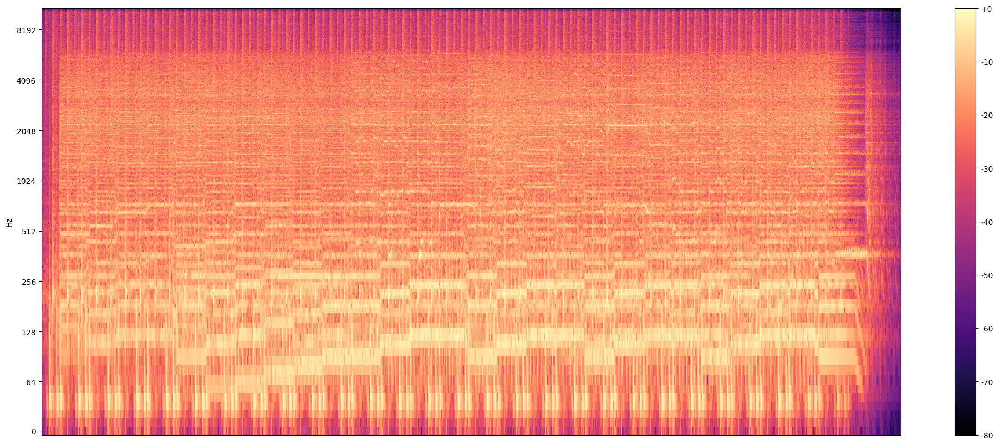

In [29]:
plot_spectrograms(y_log_scale2, sr, HOP_SIZE, y_axis="log")

Here it is much better to extract every aspect and feature for a audio as it is in much better details and for human level voice percievance.